<a href="https://colab.research.google.com/github/nomi181472/MS-DS-Practice/blob/main/Stocks_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Installing Dependencies


In [ ]:
!pip install gdown
!pip install tqdm
!pip install hvplot


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 21.1 MB/s eta 0:00:00


Downloading dataset

In [ ]:
zip_link='https://drive.google.com/uc?id=1NVdi_phk2QfCRhdzZZjTAhEYB9xIb9a9&export=download'
file_name_with_ext='dataset.zip'


gdown.download(zip_link, file_name_with_ext, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1NVdi_phk2QfCRhdzZZjTAhEYB9xIb9a9&export=download
To: /content/dataset.zip
100%|██████████| 15.9M/15.9M [00:00<00:00, 43.3MB/s]


'dataset.zip'

Unzipping the dataset

In [ ]:
folder_name="karachi_stock"
!unzip -o {file_name_with_ext} -d {folder_name}


Archive:  dataset.zip
  inflating: karachi_stock/KarachiStockExchange/About Dataset.txt  
  inflating: karachi_stock/KarachiStockExchange/UQAB.csv  
  inflating: karachi_stock/KarachiStockExchange/WEBF.csv  
  inflating: karachi_stock/KarachiStockExchange/SPL.csv  
  inflating: karachi_stock/KarachiStockExchange/ZAMT.csv  
  inflating: karachi_stock/KarachiStockExchange/ZAHID.csv  
  inflating: karachi_stock/KarachiStockExchange/SNKA.csv  
  inflating: karachi_stock/KarachiStockExchange/YOUW.csv  
  inflating: karachi_stock/KarachiStockExchange/TRPOL.csv  
  inflating: karachi_stock/KarachiStockExchange/SURAJ.csv  
  inflating: karachi_stock/KarachiStockExchange/SMBL.csv  
  inflating: karachi_stock/KarachiStockExchange/SSML.csv  
  inflating: karachi_stock/KarachiStockExchange/SZTM.csv  
  inflating: karachi_stock/KarachiStockExchange/UMEF.csv  
  inflating: karachi_stock/KarachiStockExchange/STML.csv  
  inflating: karachi_stock/KarachiStockExchange/SLSO.csv  
  inflating: karachi_st

In [ ]:
import pandas as pd
from  tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm

import datetime
from datetime import timedelta


Reading dataset

In [ ]:


class DataReader:
  def __init__(self,dataset_path,format="csv",):
    self.dataset_path=dataset_path
    self.format=format
  def read_multiple_campanies(self,date_index_col_name="Date",parse_dates=True):
    import os
    from tqdm import tqdm
    dataset={}
    files = os.listdir(self.dataset_path)
    for i in tqdm(range(len(files[:]))):
      file=files[i]
      try:
        company_name=file[:-4]
        ext=file[-3:]
        if company_name not in dataset and ext==self.format:
          path=f'{self.dataset_path}/{file}'
          dataset[company_name]=pd.read_csv(path,index_col=date_index_col_name,parse_dates=parse_dates)
      except e:
        print(f"exception: {e}")
        print(f"file location {path}")
    return dataset
all_companies_path=f'./{folder_name}/KarachiStockExchange'
companies=DataReader(all_companies_path).read_multiple_campanies()
if "KSE-100" in companies:
  del companies["KSE-100"]
print(f"Total comapanies: {len(companies)}")


100%|██████████| 831/831 [02:11<00:00,  6.31it/s]

Total comapanies: 828


In [ ]:


def handle_missing_values(prev_row,next_row,columns,missing_date):

    if prev_row.isna().all().all()==False and next_row.isna().all().all()==False:
      return pd.DataFrame((np.array(prev_row)+np.array(next_row))/2,columns=columns,index=[missing_date])

    elif prev_row.isna().all().all() and next_row.isna().all().all()==False:
      return   pd.DataFrame(next_row,index=[missing_date])
    elif prev_row.isna().all().all()==False and next_row.isna().all().all():

      return  pd.DataFrame(prev_row,index=[missing_date])
    else:
      return prev_row

def fill_missing_dates(row,pdf,p_col):
  if row.isna().all():

    index=row.name
    pdf=pdf[p_col]
    #print(type(index))
    filtered=pdf[index-timedelta(days=100):index-timedelta(days=1)]

    prev_row=filtered.dropna().tail(1)

    filtered=pdf[index+timedelta(days=1):index+timedelta(days=100) ]
    next_row=filtered.dropna().head(1)
    value=handle_missing_values(prev_row,next_row,prev_row.columns,index)
    #print(value.loc[index])

    if value.isna().all().all():
      return row
    else:
      return value.loc[index]
  else:
    #print(row)

    return row
#d=ohlc_df.apply(fill_missing_dates,axis=1,)

In [ ]:

class Utility:
  def __init__(self):
    pass
  def merge_companies_into_single_df(self,dataset,columns):

    df=pd.DataFrame(columns=columns)
    for key,sub_df in dataset.items():
      df=pd.concat([df,sub_df])
    return df


  def reduce_dataset(self,dataset,days_threshold=0):
    df=pd.DataFrame(columns=["Symbol","Days_count"])
    pre_dataset=dataset.copy()
    for i,pairs in enumerate(dataset.items()):
      key,d=pairs
      no_of_days=d["Symbol"].count()
      if no_of_days>days_threshold:
        df=pd.concat([df,pd.DataFrame({"Symbol":[key],"Days_count":[no_of_days]},),])
        df=df.reset_index(drop=True)
        df_sorted = df.sort_values(by='Days_count', ascending=False)
        df_sorted["Symbol_Ids"]=list(range(0,df["Symbol"].count()))
      else:
        del pre_dataset[key]


    return df_sorted,pre_dataset
  def handle_missing_values(self,dataset):
    for key in tqdm(dataset.keys()):
      tf=dataset[key]
      complete_date_range = pd.date_range(start=tf.index.min(), end=tf.index.max(), freq='D')
      cond=complete_date_range.strftime("%A").isin(["Sunday","Saturday"])
      complete_date_range=complete_date_range[~cond]
      tf = tf.reindex(complete_date_range)
      p_col=["Open","Low","Close","High","Volume"]
      tf[p_col]=tf[p_col].apply(fill_missing_dates,args=(tf,p_col),axis=1,)
      tf=tf.fillna(method="ffill")
      dataset[key]=tf
    return dataset
  def count_missing_dates(self,start_date,end_date,dataset):
    import numpy as np
    complete_date_range = pd.date_range(start=start_date, end=end_date, freq='D')
    cond=complete_date_range.strftime("%A").isin(["Sunday","Saturday"])
    universal_set=set(complete_date_range[~cond])
    missing_days_count=[]
    for k,dfi in dataset.items():
      missing_days_count.append(len(universal_set-set(dfi.index)))
    return missing_days_count
myutil=Utility()


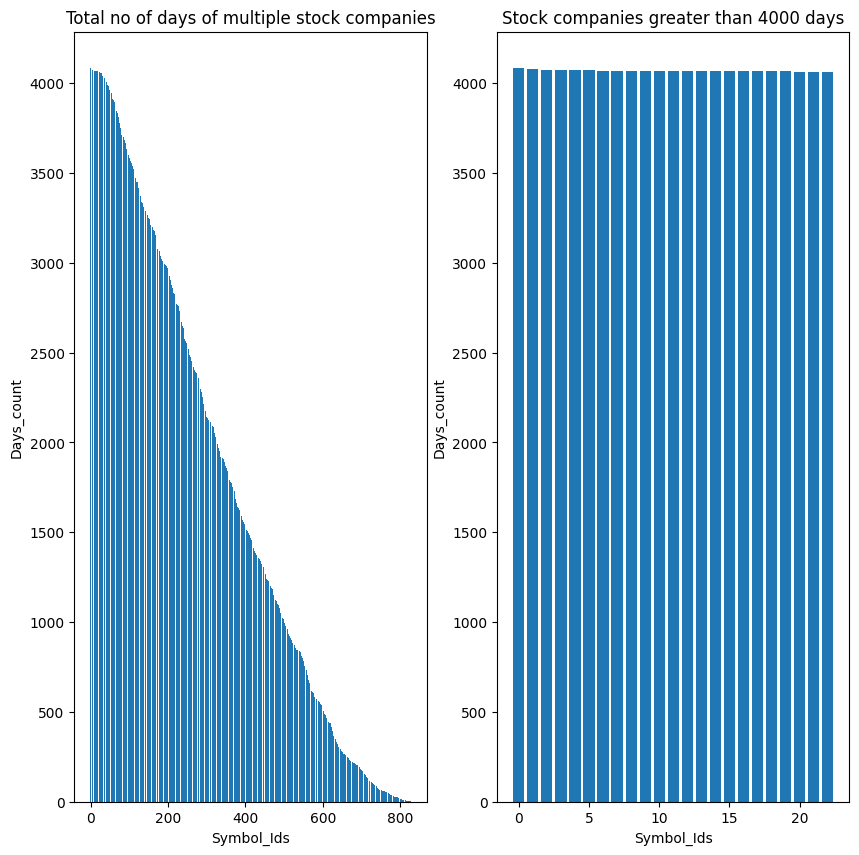

In [ ]:
df,companies=myutil.reduce_dataset(companies,0)
df_reduced,companies_r=Utility().reduce_dataset(companies,4060)
#if "KSE-100" in companies_r:
#  del companies_r["KSE-100"]



# Create the first subplot
fig = plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.bar(df["Symbol_Ids"], df['Days_count'])
plt.xlabel('Symbol_Ids')
plt.ylabel('Days_count')
plt.title('Total no of days of multiple stock companies')


# Create the second subplot
plt.subplot(1, 2, 2)
plt.bar(df_reduced["Symbol_Ids"], df_reduced['Days_count'])
plt.xlabel('Symbol_Ids')
plt.ylabel('Days_count')
plt.title('Stock companies greater than 4000 days')

plt.show()

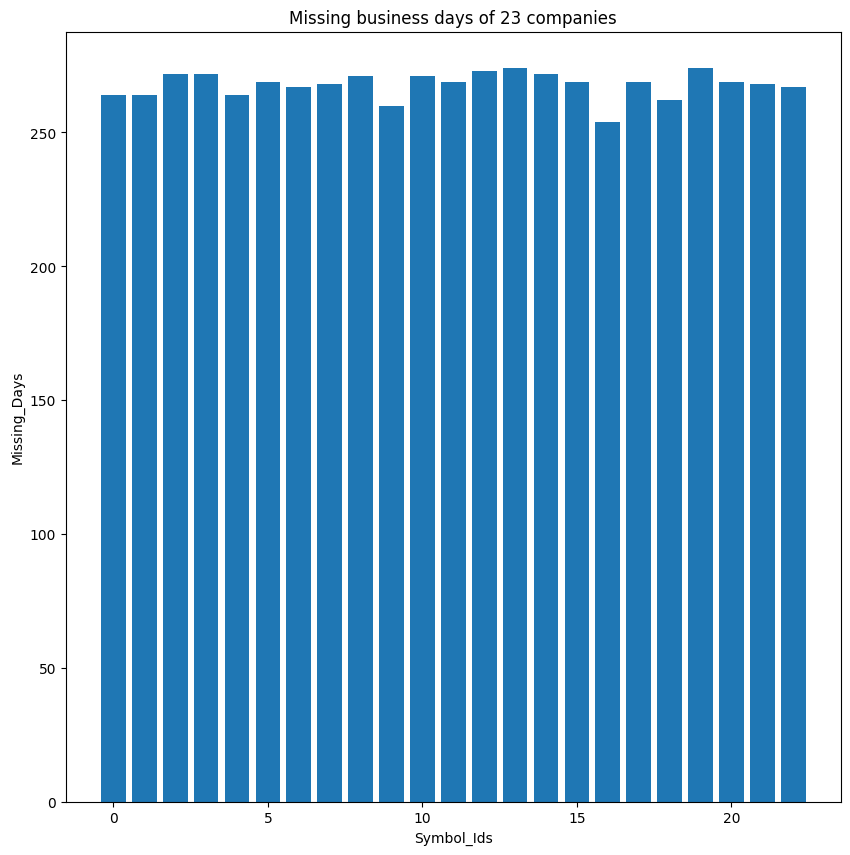

In [ ]:

missing_days_count=myutil.count_missing_dates("2003-01-01","2019-01-01",companies_r)
fig = plt.figure(figsize=(10, 10))
plt.bar(list(range(len(missing_days_count))), missing_days_count)
plt.xlabel('Symbol_Ids')
plt.ylabel('Missing_Days')
plt.title(f'Missing business days of {len(companies_r)} companies')
plt.show()

In [ ]:
#handling missing values


companies_r=myutil.handle_missing_values(companies_r)

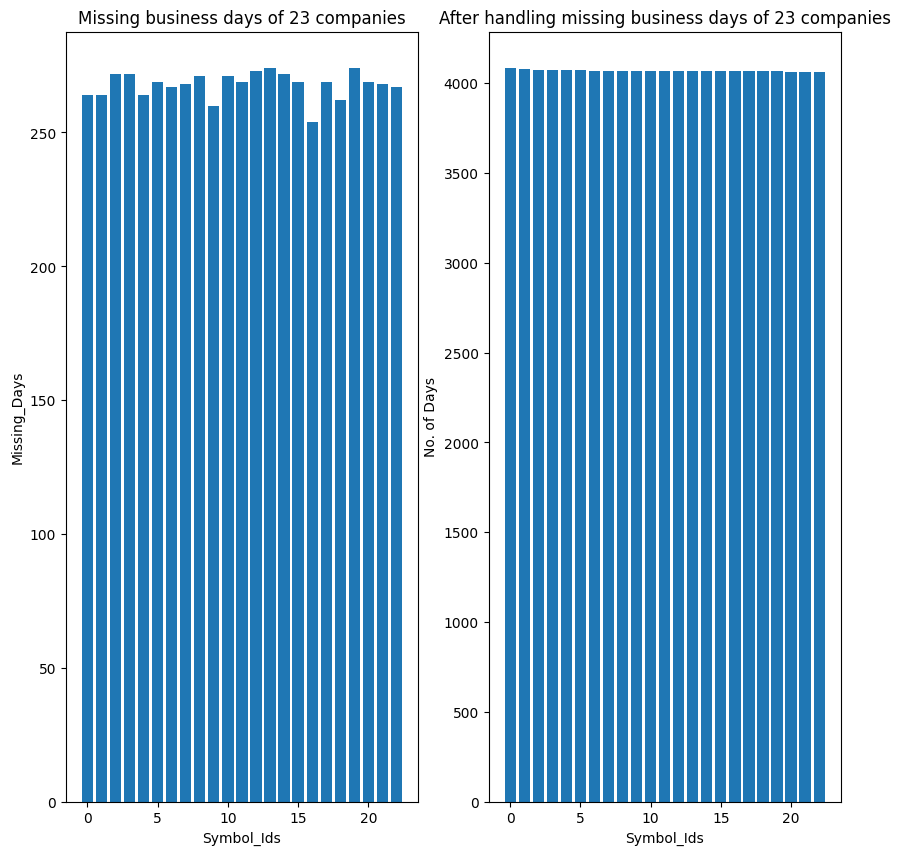

In [ ]:
#comparing after handling missing values
df_reduced,companies_r=myutil.reduce_dataset(companies_r,4060)
#checking missing days on the dataset
complete_date_range = pd.date_range(start="2003-01-01", end="2019-01-01", freq='D')


# Create the first subplot
fig = plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.bar(list(range(len(missing_days_count))), missing_days_count)
plt.xlabel('Symbol_Ids')
plt.ylabel('Missing_Days')
plt.title(f'Missing business days of {len(companies_r)} companies')


# Create the second subplot
plt.subplot(1, 2, 2)
plt.bar(df_reduced["Symbol_Ids"], df_reduced['Days_count'])
plt.xlabel('Symbol_Ids')
plt.ylabel('No. of Days')
plt.title(f'After handling missing business days of {len(companies_r)} companies')

plt.show()

In [ ]:
companies_r.keys()

dict_keys(['FFC', 'NBP', 'HUBC', 'ATRL', 'AKBL', 'BOP', 'POL', 'LOTCHEM', 'MLCF', 'SNGP', 'MCB', 'TELE', 'PIAA', 'FFBL', 'PSO', 'FCCL', 'KEL', 'NML', 'BYCO', 'BAHL', 'PTC', 'DFML', 'ENGRO'])

preprocessing on dataset

OHLC data for each company to observe trends and patterns over time.

In [ ]:

import yfinance as yf
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def plotMovingAverageChart(companies, noOfPlots = 5):
  companyNames = companies.keys()

  currentIteration =0
  for companyName in companyNames:
    fig = go.Figure()

    if currentIteration > noOfPlots:
      break

    fig = go.Figure()


    fig.add_trace(go.Candlestick(x=companies[companyName].index,
                open=companies[companyName]['Open'],
                high=companies[companyName]['High'],
                low=companies[companyName]['Low'],
                close=companies[companyName]['Close'],
                name='Candlesticks'))

    fig.add_trace(go.Scatter(x=companies[companyName].index, y=companies[companyName]['Close'].rolling(window=20).mean(), mode='lines', name='20-day MA'))
    fig.add_trace(go.Scatter(x=companies[companyName].index, y=companies[companyName]['Close'].rolling(window=50).mean(), mode='lines', name='50-day MA'))

    # Update layout
    fig.update_layout(title="{} Stock Price with Moving Averages".format(companyName),
                  xaxis_title='Date',
                  yaxis_title="{} Stock Price".format(companyName),
                  xaxis_rangeslider_visible=False)
    currentIteration+=1
    fig.show()









plotMovingAverageChart(companies_r)





line charts for a visual representation of the stock price movements.

In [ ]:
def plotLineChart(companies, noOfPlots = 5, feature='Close'):
  companyNames = companies.keys()

  currentIteration =0
  for companyName in companyNames:
    fig = go.Figure()

    if currentIteration > noOfPlots:
      break

    fig = go.Figure()
    fig.add_trace(go.Scatter(x=companies[companyName].index,y=companies[companyName][feature], mode='lines', name=f'{feature} Price'))

    # Update layout
    fig.update_layout(title=f'{companyName} {feature} Price',xaxis_title='Date',yaxis_title=f'{feature} Price',template='plotly_dark')
    currentIteration+=1
    fig.show()



plotLineChart(companies_r)

Volatility Analysis:Calculate and visualize the volatility of each company's stock prices. This can be done using methods such as moving averages, Bollinger Bands, or historical volatility.

In [ ]:
def historicalVolatalityGraph(companies, window_size=20, noOfPlots = 5):
  companyNames = companies.keys()

  currentIteration=0

  for companyName in companyNames:
    if currentIteration > noOfPlots:
      break

    # Calculate daily returns
    companies[companyName]['Daily Returns'] = companies[companyName]['Close'].pct_change()

    # Calculate rolling standard deviation (volatility)
    companies[companyName]['Volatility'] = companies[companyName]['Daily Returns'].rolling(window=window_size).std()
    # Create candlestick chart with historical volatility
    fig = go.Figure()
    # Candlestick chart
    fig.add_trace(go.Candlestick(x=companies[companyName].index,
                open=companies[companyName]['Open'],
                high=companies[companyName]['High'],
                low=companies[companyName]['Low'],
                close=companies[companyName]['Close'],
                name='Candlestick'))
    # Scatter plot for historical volatility
    fig.add_trace(go.Scatter(x=companies[companyName].index,
                y=companies[companyName]['Volatility'],
                mode='lines',
                line=dict(color='red'),
                name='Volatility'))
    # Update layout
    fig.update_layout(title=f'{companyName} Candlestick Chart with Historical Volatility', xaxis_title='Date', yaxis_title='Price',template='plotly_dark')  # Optional: Use a dark theme)
    # Show the plot
    fig.show()
    currentIteration+=1



historicalVolatalityGraph(companies_r)



Correlation Analysis:Examine the correlation between the stock prices of different companies. A correlation matrix can help identify relationships and dependencies among stocks.


Q) Given the historical correlations between two stocks, what is the likelihood that they will move in the same direction on a specific trading day?

1. **Positive Correlation:**
   - If the correlation coefficient is positive, it suggests a tendency for the stocks to move in the same direction. The closer the correlation coefficient is to +1, the stronger the positive correlation.
   - You might say that there is a "higher likelihood" or "greater probability" that the stocks will move in the same direction on a given day.

2. **Negative Correlation:**
   - If the correlation coefficient is negative, it suggests a tendency for the stocks to move in opposite directions. The closer the correlation coefficient is to -1, the stronger the negative correlation.
   - You might say that there is a "higher likelihood" or "greater probability" that the stocks will move in opposite directions on a given day.

3. **No Correlation:**
   - If the correlation coefficient is close to 0, it suggests little to no linear relationship between the stocks.
   - In this case, you might say that there is a "lower likelihood" or "lower probability" that the stocks will move in the same or opposite directions based on their historical correlation.

In the correlation heatmap we can see that PIOC, KEL and CHCC have high positive correlation so the likelihood that they will move in the same direction on a specific trading day will be high

In [ ]:
import plotly.figure_factory as ff

# correlation of companies
def correlationHeatMap(companies, companyNames=[], features=['Close']):
  featureOfCompanies = pd.DataFrame(columns=companyNames)
  companiesStr = ''
  for companyName in companyNames:
    featureOfCompanies[companyName] = companies[companyName][features]
    companiesStr += companyName+', '

  corr_matrix = featureOfCompanies.corr()
  fig = ff.create_annotated_heatmap(z=corr_matrix.values,
                                  x=list(corr_matrix.columns),
                                  y=list(corr_matrix.index),
                                  annotation_text=corr_matrix.round(2).values,
                                  showscale=True)
  fig.update_layout(title=f'Correlation Heatmap of Stock Price of Companies {companiesStr}',
                  xaxis_title='Stock Prices',
                  yaxis_title='Stock Prices')
  fig.show()


correlationHeatMap(companies_r, list(companies_r.keys())[0:20])

Q)Determine the correlation between the closing prices of 2 rivalry companies over the last six months.

It can be seen from the correlation heatmap that rivalry companies have high positive correlation which means if stock price of one company is rising then stock prices of other companies within the same sector are also increasing.Companies operating in the same industry often face similar market conditions, economic trends, and regulatory environments. Positive developments or challenges within the industry can impact all companies within it.

In [ ]:
past_six_month_data_companies = {}



for key, value in companies_r.items():
  end_date = value.index.max()
  start_date = end_date - pd.DateOffset(months=6)
  past_six_month_data_companies[key] = value.loc[start_date:end_date]

#Cement Companies ['LUCK', 'DCL', 'DGKC', 'MLCF', 'CHCC', 'FCCL']
#Motors Companies ['PSMC', 'INDU', 'HCAR', 'DFML']



correlationHeatMap(past_six_month_data_companies, ['LUCK', 'DCL', 'DGKC', 'MLCF', 'CHCC', 'FCCL'])

NameError: ignored

Returns Analysis:Calculate daily, weekly, or monthly returns based on the OHLC data. Analyze the distribution of returns and look for outliers or patterns.

In [ ]:

def returnAnalysisGraph(companies, companyNames=['NBP', 'BOP', 'BYCO', 'MCB', 'ENGRO'], index_col='Date'):

  for companyName in companyNames:
    df = companies[companyName].copy()

    # Calculate daily returns
    df['Daily_Return'] = df['Close'].pct_change()

    # Calculate weekly returns (assuming daily data)
    df['Weekly_Return'] = df.resample('W-Fri').last()['Close'].pct_change()

    # Calculate monthly returns
    df['Monthly_Return'] = df.resample('M').last()['Close'].pct_change()

    # Plot daily returns
    fig_daily = go.Figure()
    fig_daily.add_trace(go.Scatter(x=df.index, y=df['Daily_Return'], mode='lines', name='Daily Returns', line=dict(color='blue')))
    fig_daily.update_layout(title=f'Daily Returns of {companyName}', xaxis=dict(title='Date'), yaxis=dict(title='Returns'))
    fig_daily.show()

    # Plot weekly returns

    fig_weekly = go.Figure()
    fig_weekly.add_trace(go.Scatter(x=df.dropna().resample('W-Fri').last().index, y=df['Weekly_Return'].dropna(), mode='lines', name='Weekly Returns', line=dict(color='green')))
    fig_weekly.update_layout(title=f'Weekly Returns of {companyName}', xaxis=dict(title='Date'), yaxis=dict(title='Returns'))
    fig_weekly.show()

    # Plot monthly returns
    fig_monthly = go.Figure()
    fig_monthly.add_trace(go.Scatter(x=df.dropna().resample('M').last().index, y=df['Monthly_Return'].dropna(), mode='lines', name='Monthly Returns', line=dict(color='orange')))
    fig_monthly.update_layout(title=f'Monthly Returns of {companyName}', xaxis=dict(title='Date'), yaxis=dict(title='Returns'))
    fig_monthly.show()



returnAnalysisGraph(companies_r, list(companies_r.keys())[0:5])


Top Five Companies With High, Low, And Avg Volatility

In [ ]:

import matplotlib.pyplot as plt

# low std : <0.1, medium: 0.1 to 0.3 , high>0.3
def volatiliyGraph(companies, window_size=20, noOfCompanies=5):
  companyNames = companies.keys()
  endRange = 0
  companiesVolatility = {}

  import plotly.express as px
  for companyName in companyNames:
    companies[companyName].dropna(inplace=True)
    companies[companyName]['Daily Returns'] = companies[companyName]['Close'].pct_change()

    # Calculate rolling standard deviation (volatility)
    temp = companies[companyName]['Daily Returns'].std()
    if not pd.isna(temp):
      companiesVolatility[companyName] = temp
    else:
      companiesVolatility[companyName] = 0

  companiesVolatilityDf = pd.DataFrame({'company': companiesVolatility.keys(), 'volatility': companiesVolatility.values()})
  companiesVolatilityDf.sort_values(by='volatility', inplace=True)

  middle = companiesVolatilityDf.iloc[(len(companiesVolatilityDf) // 2 - 2):(len(companiesVolatilityDf) // 2 + 3)]
  #avgCompaniesVolatilityDf = companiesVolatilityDf[(companiesVolatilityDf['volatility'] > 0.1) & (companiesVolatilityDf['volatility'] < 0.3)].head(n=noOfCompanies)
  fig = px.bar(companiesVolatilityDf.head(n=noOfCompanies).append(middle, ignore_index=True).append(companiesVolatilityDf.tail(n=noOfCompanies),ignore_index=True), x='company', y='volatility', title='Top Five Companies With High, Avg, and Low Volatility Bar Chart')
  fig.show()


volatiliyGraph(companies_r)

<ipython-input-19-2393f0a70d42>:26: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



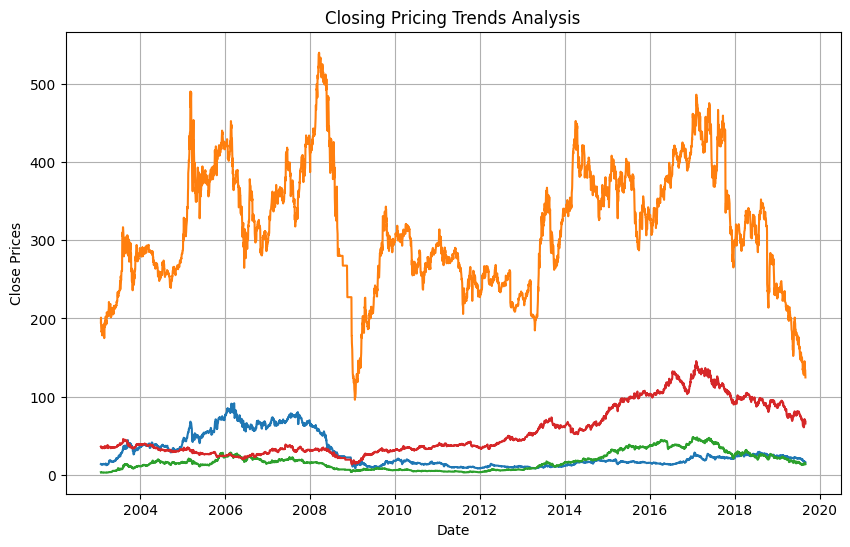

In [ ]:
# Identify any long-term trends or cycles in the closing prices using a suitable visualization technique.
#companies_r["FABL"].head()
selected_companies = ["FABL", "PSO", "FCCL","HUBC"]
plt.figure(figsize=(10,6))
plt.grid(True)
plt.title("Closing Pricing Trends Analysis")
plt.xlabel('Date')
plt.ylabel('Close Prices')
for x in selected_companies:
  company = companies_r[x]
  plt.plot(company['Close'])
plt.show()

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3430: FutureWarning:

In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3430: FutureWarning:

The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3571: FutureWarning:

The default value of numeric_only in DataFrame.std is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.



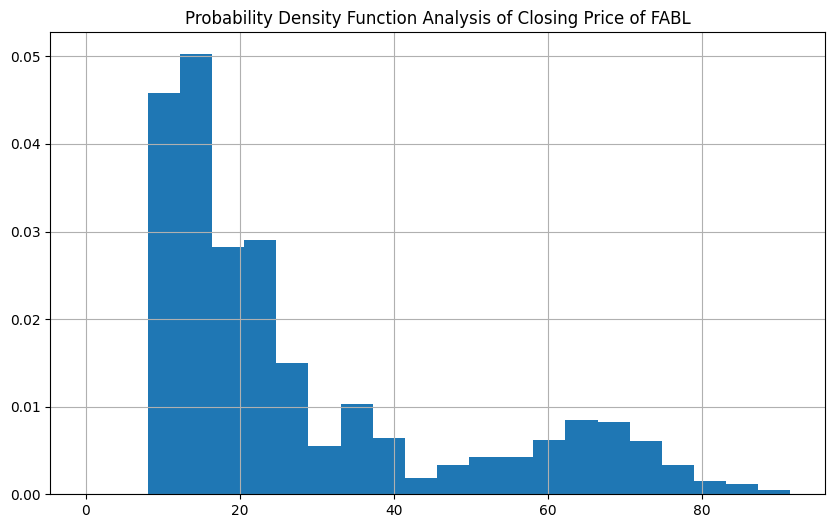

In [ ]:
# Calculate the probability density function (PDF) of the closing prices and visualize it (select any company)
selected_companies = ["FABL"]
plt.figure(figsize=(10,6))
plt.grid(True)
plt.title("Probability Density Function Analysis of Closing Price of FABL")

for x in selected_companies:
  company = companies_r[x]
  sample_mean=np.mean(company)
  sample_std=np.std(company)
  dist=norm(sample_mean,sample_std)
  values=[value for value in company["High"]]
  prob=[dist.pdf(company["High"].count())]
  plt.hist(company['Close'],bins=20,density=True)
  plt.plot(prob)
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



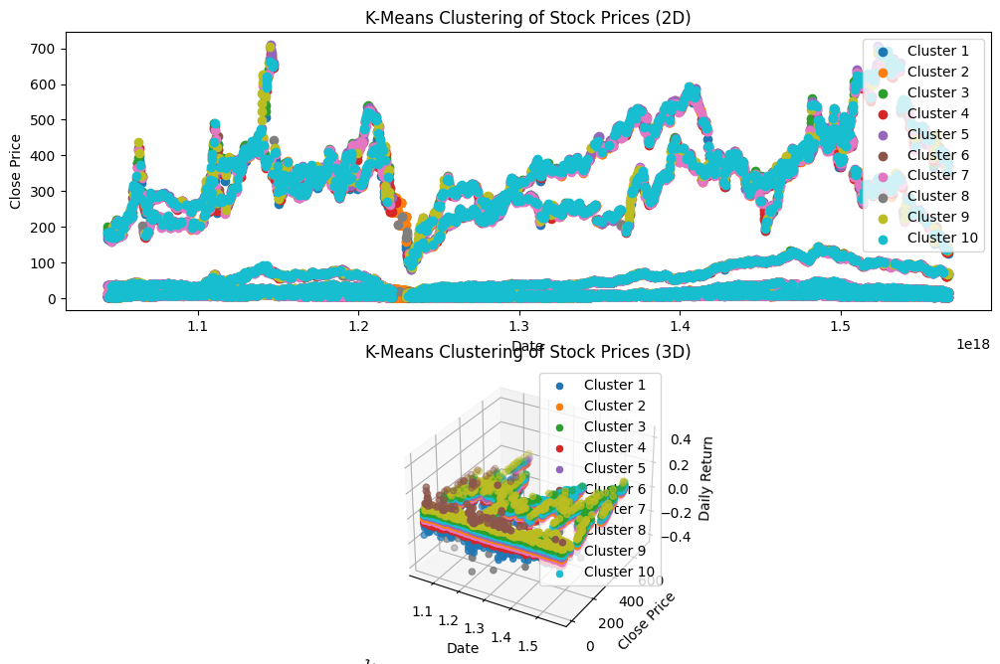

In [ ]:
#Cluster Analysis:Apply clustering techniques to group companies with similar stock price behaviors.
df=myutil.merge_companies_into_single_df(companies_r,companies_r["PSO"].columns)
df=df.reset_index()

import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


df['Daily_Return'] = df.groupby('Symbol')['Close'].pct_change()
df=df.dropna().reset_index(drop=True)

features = ['Daily_Return']
df_normalized = df.groupby('Symbol')[features].transform(lambda x: (x - x.mean()) / x.std())


k = 10 # You can choose a different number of clusters based on your analysis
kmeans = KMeans(n_clusters=k, random_state=42)
df['Cluster'] = kmeans.fit_predict(df_normalized)


fig = plt.figure(figsize=(12, 8))


plt.subplot(2, 1, 1)
for cluster in range(k):
    cluster_data = df[df['Cluster'] == cluster]
    plt.scatter(cluster_data["index"].astype(int), cluster_data['Close'], label=f'Cluster {cluster + 1}')

plt.title('K-Means Clustering of Stock Prices (2D)')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()


ax = fig.add_subplot(2, 1, 2, projection='3d')
for cluster in range(k):
    cluster_data = df[df['Cluster'] == cluster]
    ax.scatter(cluster_data["index"].astype(int), cluster_data['Close'], cluster_data['Daily_Return'], label=f'Cluster {cluster + 1}')

ax.set_title('K-Means Clustering of Stock Prices (3D)')
ax.set_xlabel('Date')
ax.set_ylabel('Close Price')
ax.set_zlabel('Daily Return')
plt.legend()


plt.show()



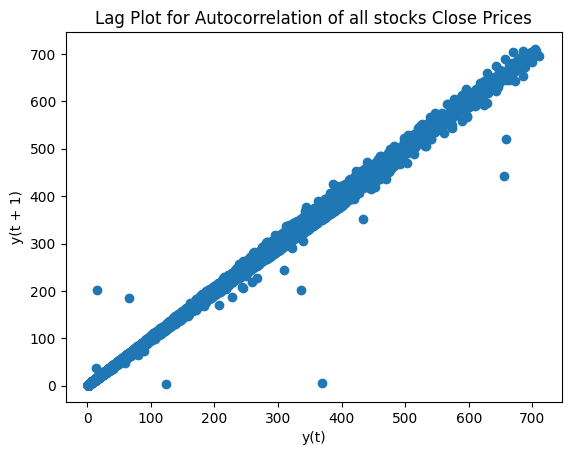

In [ ]:
#check whether the dataset has 1) randomness, 2)seasonal patterns, 3) Autocorrelation and autoregressive Create lag plots to examine autocorrelation and identify any repeating patterns or cycles in the data.Cross-Company Comparisons:Compare the performance of different companies using side-by-side visualizations or statistical measures. Look for relative strength or weakness.
import pandas as pd
import matplotlib.pyplot as plt
from pandas.plotting import lag_plot


lag_plot(df['Close'])
plt.title('Lag Plot for Autocorrelation of all stocks Close Prices')
plt.show()


In [ ]:
import pandas as pd
import hvplot.pandas  # noqa


index = pd.DatetimeIndex( companies_r["PSO"].index)
dic={}
for key,df in companies_r.items():
  dic[key]=df["Close"]
stock_df = pd.DataFrame(dic, index=companies_r["PSO"].index)
import holoviews as hv
hv.extension('bokeh')


hvplot.lag_plot(stock_df, lag=365, alpha=0.3)

:Scatter   [y(t)]   (y(t + 365),variable)

In [ ]:
companies_r.keys()

dict_keys(['FFC', 'NBP', 'HUBC', 'ATRL', 'AKBL', 'BOP', 'POL', 'LOTCHEM', 'MLCF', 'SNGP', 'MCB', 'TELE', 'PIAA', 'FFBL', 'PSO', 'FCCL', 'KEL', 'NML', 'BYCO', 'BAHL', 'PTC', 'DFML', 'ENGRO'])

Mean Squared Error: 406.39865498466907


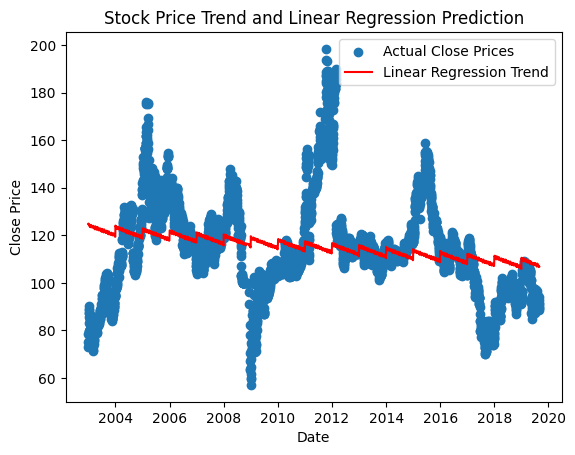

Predicted Close Price for the next year: 109.46903681390586


In [ ]:
"""What is the likelihood that the stock will continue its upward trend in the next year, given its performance over the past n years? (make a function so that we can give different company in the function )
"""
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Assuming you have a CSV file with historical stock prices
# Replace 'your_stock_data.csv' with the actual file name or provide the necessary data retrieval code

# Read historical stock price data from CSV
df = companies_r["FFC"]

# Convert the 'Date' column to datetime format
df['Date'] = pd.to_datetime(df.index)

# Sort the dataframe by date in ascending order

# Extract relevant features (you may need to customize this based on your data)
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day
df['Day_of_week'] = df['Date'].dt.dayofweek

# Assume 'Close' price as the dependent variable
X = df[['Year', 'Month', 'Day', 'Day_of_week']]
y = df['Close']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train a linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model (you may need a more comprehensive evaluation)
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Visualize the trend and predictions
plt.scatter(df['Date'], df['Close'], label='Actual Close Prices')
plt.plot(df['Date'], model.predict(X), color='red', label='Linear Regression Trend')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.title('Stock Price Trend and Linear Regression Prediction')
plt.legend()
plt.show()

# Make a prediction for the next year (you may need to adjust this based on your prediction horizon)
next_year = max(df['Year']) + 1
prediction_input = pd.DataFrame({'Year': [next_year], 'Month': [1], 'Day': [1], 'Day_of_week': [0]})
next_year_prediction = model.predict(prediction_input)

print(f'Predicted Close Price for the next year: {next_year_prediction[0]}')


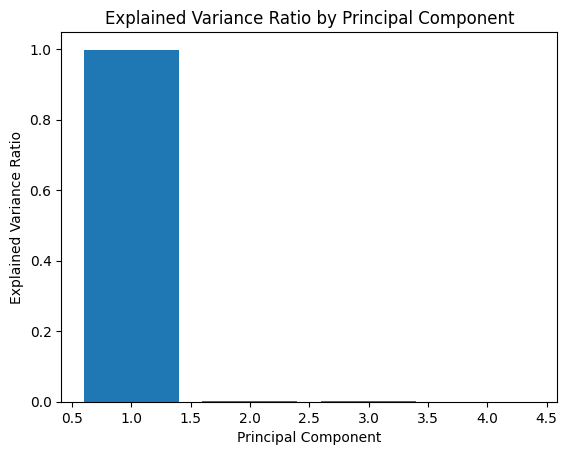

The most important principal component is PC1.
Loadings of the most important principal component:
  Feature   Loading
2    High  0.500049
1     Low  0.500038
3   Close  0.499985
0    Open  0.499928


In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Assuming you have a CSV file with historical stock prices
# Replace 'your_stock_data.csv' with the actual file name or provide the necessary data retrieval code

# Read historical stock price data from CSV
df = df = companies_r["FFC"]

# Extract relevant features (Open, Low, High, Close)
features = df[['Open', 'Low', 'High', 'Close']]

# Standardize the features
scaler = StandardScaler()
features_standardized = scaler.fit_transform(features)

# Apply PCA
pca = PCA()
pca_result = pca.fit_transform(features_standardized)

# Explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Plot the explained variance ratio
plt.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, align='center')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance Ratio by Principal Component')
plt.show()

# Determine which principal component explains the most variance
most_important_pc = explained_variance_ratio.argmax() + 1
print(f"The most important principal component is PC{most_important_pc}.")

# Display the loadings of the most important principal component
loadings = pca.components_[most_important_pc - 1]
loadings_df = pd.DataFrame({'Feature': features.columns, 'Loading': loadings})
loadings_df = loadings_df.sort_values(by='Loading', ascending=False)

print("Loadings of the most important principal component:")
print(loadings_df)


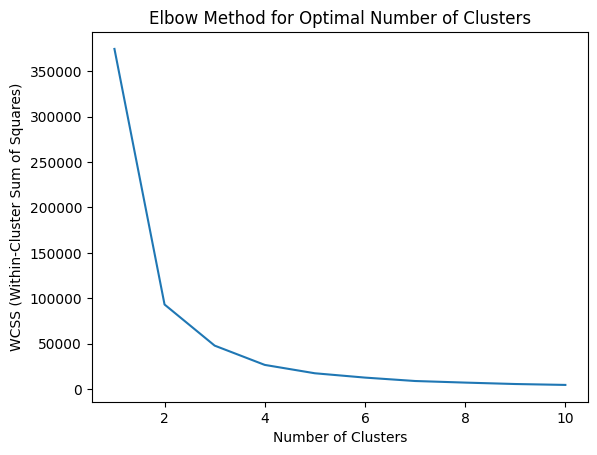

Cluster assignments:
           Company  Cluster
Date                       
2003-01-01   ENGRO        1
2003-01-02   ENGRO        1
2003-01-03   ENGRO        1
2003-01-06   ENGRO        1
2003-01-07   ENGRO        1
...            ...      ...
2019-08-26     FFC        1
2019-08-27     FFC        1
2019-08-28     FFC        1
2019-08-29     FFC        1
2019-08-30     FFC        1

[93588 rows x 2 columns]


Text(0.5, 0.92, '3D Scatter')

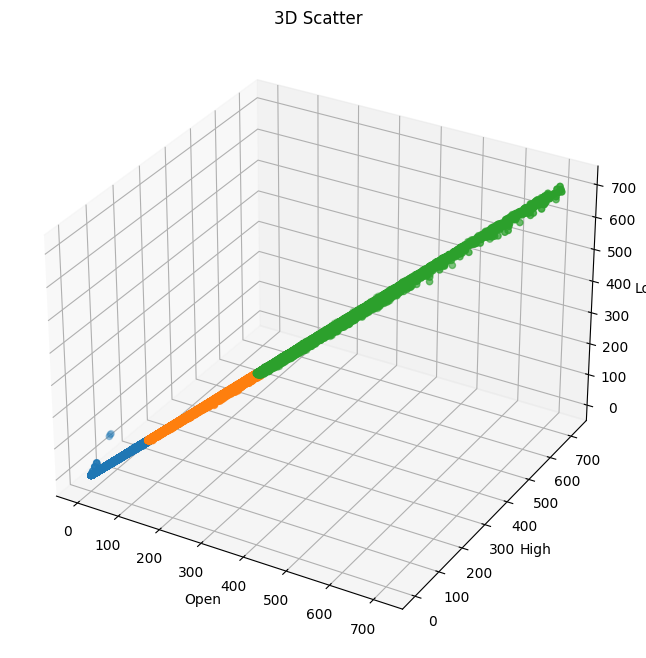

In [ ]:
"""Which principal component among Open, Low, High, and Close explains the most variance in the stock prices of any given company? (make a function so that we can give different company in the function )
"""

import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Assuming you have a CSV file with OHLC data for multiple companies
# Replace 'your_stock_data.csv' with the actual file name or provide the necessary data retrieval code

# Read OHLC data from CSV
df=pd.DataFrame()
for k,tdf in companies_r.items():
  tdf["Company"]=k
  df=pd.concat([tdf,df])


# Select relevant features (Open, High, Low, Close)
features = df[['Open', 'High', 'Low', 'Close']]

# Standardize the features
scaler = StandardScaler()
features_standardized = scaler.fit_transform(features)

# Determine the optimal number of clusters using the Elbow Method
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(features_standardized)
    wcss.append(kmeans.inertia_)

# Plot the Elbow Method to find the optimal number of clusters
plt.plot(range(1, 11), wcss)
plt.title('Elbow Method for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS (Within-Cluster Sum of Squares)')
plt.show()

# Choose the optimal number of clusters (in this example, let's say it's 3)
optimal_num_clusters = 3

# Apply K-means clustering with the optimal number of clusters
kmeans = KMeans(n_clusters=optimal_num_clusters, init='k-means++', max_iter=300, n_init=10, random_state=0)
df['Cluster'] = kmeans.fit_predict(features_standardized)

# Display the cluster assignments for each company
print("Cluster assignments:")
print(df[['Company', 'Cluster']])

# You can further analyze the clusters and visualize them based on your requirements
# For example, you can plot a 3D scatter plot with Open, High, Low, Close as axes and use color to represent clusters
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

for cluster in range(optimal_num_clusters):
    cluster_data = df[df['Cluster'] == cluster]
    ax.scatter(cluster_data['Open'], cluster_data['High'], cluster_data['Low'], label=f'Cluster {cluster + 1}')

ax.set_xlabel('Open')
ax.set_ylabel('High')
ax.set_zlabel('Low')
ax.set_title('3D Scatter')


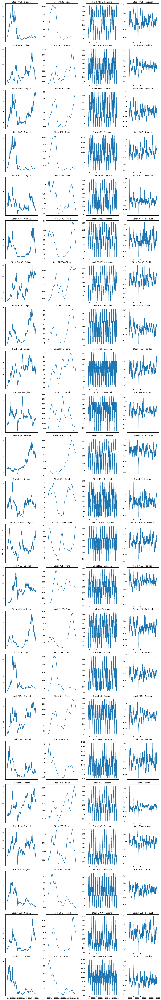

In [ ]:
import pandas as pd
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

# Assuming you have a CSV file with OHLC data for multiple stocks
# Replace 'your_stock_data.csv' with the actual file name or provide the necessary data retrieval code

# Read OHLC data from CSV
df=pd.DataFrame()
for k,tdf in companies_r.items():
  tdf["Stock"]=k
  df=pd.concat([tdf,df])

# Function to decompose the stock movement into seasonality, trend, and residual
def decompose_stock(stock_data):
    result = seasonal_decompose(stock_data, model='multiplicative', period=252)  # Assuming trading days in a year
    return result

# Apply decomposition to each stock
n_stocks = df['Stock'].nunique()  # Replace 'Stock' with the actual column name representing different stocks
fig, axes = plt.subplots(n_stocks, 4, figsize=(15, 4 * n_stocks), sharex=True)

for i, (stock, stock_data) in enumerate(df.groupby('Stock')):
    result = decompose_stock(stock_data['Close'])

    # Plot original stock movement
    axes[i, 0].plot(stock_data.index, stock_data['Close'], label='Original')
    axes[i, 0].set_title(f'Stock {stock} - Original')

    # Plot trend component
    axes[i, 1].plot(result.trend, label='Trend')
    axes[i, 1].set_title(f'Stock {stock} - Trend')

    # Plot seasonal component
    axes[i, 2].plot(result.seasonal, label='Seasonal')
    axes[i, 2].set_title(f'Stock {stock} - Seasonal')

    # Plot residual component
    axes[i, 3].plot(result.resid, label='Residual')
    axes[i, 3].set_title(f'Stock {stock} - Residual')

# Adjust layout
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

# Assuming you have a CSV file with OHLC data for multiple stocks
# Replace 'your_stock_data.csv' with the actual file name or provide the necessary data retrieval code

# Read OHLC data from CSV
df = cmpani

# Set the 'Date' column as the index
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

# Function to decompose the stock movement into seasonality, trend, and residual
def decompose_stock(stock_data):
    result = seasonal_decompose(stock_data, model='multiplicative', period=252)  # Assuming trading days in a year
    return result

# Apply decomposition to each stock
n_stocks = df['Stock'].nunique()  # Replace 'Stock' with the actual column name representing different stocks
fig, axes = plt.subplots(n_stocks, 4, figsize=(15, 4 * n_stocks), sharex=True)

for i, (stock, stock_data) in enumerate(df.groupby('Stock')):
    result = decompose_stock(stock_data['Close'])

    # Plot original stock movement
    axes[i, 0].plot(stock_data.index, stock_data['Close'], label='Original')
    axes[i, 0].set_title(f'Stock {stock} - Original')

    # Plot trend component
    axes[i, 1].plot(result.trend, label='Trend')
    axes[i, 1].set_title(f'Stock {stock} - Trend')

    # Plot seasonal component
    axes[i, 2].plot(result.seasonal, label='Seasonal')
    axes[i, 2].set_title(f'Stock {stock} - Seasonal')

    # Plot residual component
    axes[i, 3].plot(result.resid, label='Residual')
    axes[i, 3].set_title(f'Stock {stock} - Residual')

# Adjust layout
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt

# Assuming you have a CSV file with historical stock prices
# Replace 'your_stock_data.csv' with the actual file name or provide the necessary data retrieval code

# Read historical stock price data from CSV
df = companies_r["FFC"]

# Extract relevant features (for simplicity, using only OHLC prices)
data = df[['Open', 'High', 'Low', 'Close']].values.astype(float)

# Normalize the data using Min-Max scaling
scaler = MinMaxScaler()
data_scaled = scaler.fit_transform(data)

# Define function to create input sequences and labels
def create_sequences(data, seq_length):
    sequences = []
    labels = []
    for i in range(len(data) - seq_length):
        seq = data[i:i+seq_length]
        label = data[i+seq_length:i+seq_length+1]
        sequences.append(seq)
        labels.append(label)
    return np.array(sequences), np.array(labels)

# Set sequence length (number of days to look back)
seq_length = 10

# Create sequences and labels
sequences, labels = create_sequences(data_scaled, seq_length)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(sequences, labels, test_size=0.2, random_state=42)

# Define a simple neural network model
class SimpleNeuralNetwork:
    def __init__(self, input_size, hidden_size, output_size):
        self.weights_input_hidden = np.random.rand(input_size, hidden_size)
        self.weights_hidden_output = np.random.rand(hidden_size, output_size)
        self.bias_hidden = np.zeros((1, hidden_size))
        self.bias_output = np.zeros((1, output_size))

    def forward(self, inputs):
        self.hidden_input = np.dot(inputs, self.weights_input_hidden) + self.bias_hidden
        self.hidden_output = self.sigmoid(self.hidden_input)
        self.final_input = np.dot(self.hidden_output, self.weights_hidden_output) + self.bias_output
        self.predictions = self.final_input  # Linear activation for simplicity
        return self.predictions

    def sigmoid(self, x):
        return 1 / (1 + np.exp(-x))

# Initialize the neural network
input_size = 4  # Number of features (OHLC)
hidden_size = 8
output_size = 4  # Predicting OHLC prices
learning_rate = 0.01

model = SimpleNeuralNetwork(input_size, hidden_size, output_size)

# Training the model
num_epochs = 1000

for epoch in range(num_epochs):
    # Forward pass
    predictions = model.forward(X_train)

    # Calculate loss (Mean Squared Error)
    loss = np.mean((predictions - y_train)**2)

    # Backward pass (Gradient Descent)
    output_error = predictions - y_train
    hidden_layer_error = np.dot(output_error, model.weights_hidden_output.T) * (model.hidden_output * (1 - model.hidden_output))

    model.weights_hidden_output -= learning_rate * np.dot(model.hidden_output.T, output_error)
    model.weights_input_hidden -= learning_rate * np.dot(X_train.reshape(-1, input_size).T, hidden_layer_error)
    model.bias_output -= learning_rate * np.sum(output_error, axis=0, keepdims=True)
    model.bias_hidden -= learning_rate * np.sum(hidden_layer_error, axis=0, keepdims=True)

    if epoch % 100 == 0:
        print(f'Epoch {epoch}, Loss: {loss}')

# Testing the model
predictions_test = model.forward(X_test)

# Transform predictions and actual values back to original scale
predictions_test = scaler.inverse_transform(predictions_test)
y_test_original = scaler.inverse_transform(y_test)

# Plotting predictions vs actual values
plt.plot(predictions_test[:, -1], label='Predicted Close')
plt.plot(y_test_original[:, -1], label='Actual Close')
plt.xlabel('Days')
plt.ylabel('Stock Price')
plt.title('Stock Price Prediction using Simple Neural Network')
plt.legend()
plt.show()


ValueError: ignored

[*********************100%%**********************]  10 of 10 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FB']: Exception('%ticker%: No timezone found, symbol may be delisted')


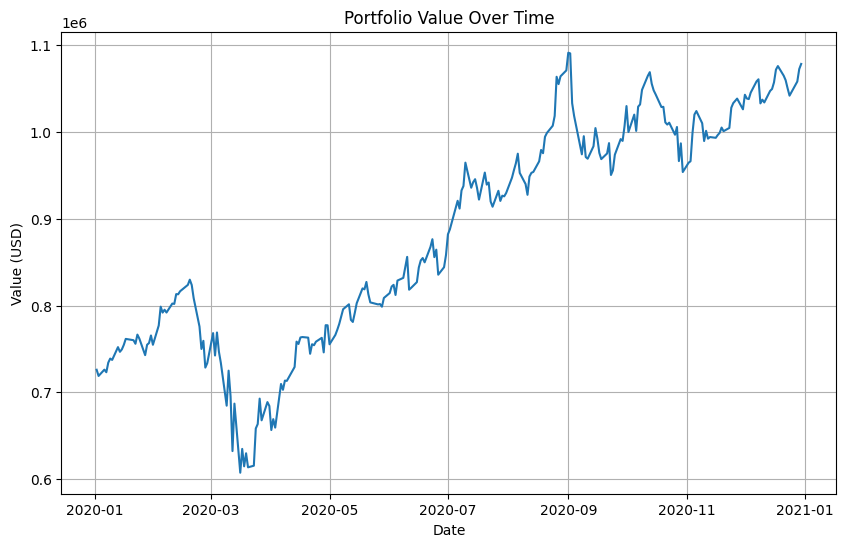

The ROI for the portfolio is 48.51%


In [ ]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import yfinance as yf

# Define the start and end dates
start = "2020-01-01"
end = "2020-12-31"

# Define the list of 10 companies (you can change them as you wish)
companies = ["AAPL", "MSFT", "AMZN", "GOOG", "FB", "TSLA", "NFLX", "BABA", "V", "MA"]

# Download the OHLC data for the 10 companies
data = yf.download(companies, start, end)

# Extract the adjusted close prices
adj_close = data["Adj Close"]

# Multiply the adjusted close prices by 500
stock_value = adj_close * 500

# Sum up the stock values for each company
portfolio_value = stock_value.sum(axis=1)

# Plot the portfolio value over time
plt.figure(figsize=(10,6))
plt.plot(portfolio_value)
plt.title("Portfolio Value Over Time")
plt.xlabel("Date")
plt.ylabel("Value (USD)")
plt.grid()
plt.show()

# Calculate the ROI
initial_value = portfolio_value[0]
final_value = portfolio_value[-1]
roi = (final_value - initial_value) / initial_value
print(f"The ROI for the portfolio is {roi:.2%}")
